## Data Understanding

<font color="blue"> 
Most of the attributes exposed by spotify come from echonest, here's a great article that 
it depicts valence and arousal as attributes to describe better emotions:   
</font>
[here](https://athina-b.medium.com/music-out-of-chaos-7568524bec0d)

In [1]:
from ipynb.fs.full.DBMySQLConnection import getDB, connectDB, getDBDataFrame
from ipynb.fs.full.Utils import MOOD_CATEGORIES, setMoodNumber, setMoodLabel
import pandas as pd
import plotly.express as px
import dask_ml.cluster
import copy
import math 
import seaborn as sns
import matplotlib.pylab as plt
import os 
from matplotlib import pyplot

In [2]:
def setMoodNumber(cat):  
    cat = cat.mood
    if cat == 'sad':
        return MOOD_CATEGORIES['sad']
    elif cat == 'bored':
        return MOOD_CATEGORIES['bored']
    elif cat == 'nervous':
        return MOOD_CATEGORIES['nervous']
    elif cat == 'angry':
        return MOOD_CATEGORIES['angry']
    elif cat == 'sleepy':
        return MOOD_CATEGORIES['sleepy']
    elif cat == 'calm':
        return MOOD_CATEGORIES['calm']
    elif cat == 'excited':
        return MOOD_CATEGORIES['excited']
    elif cat == 'peaceful':
        return MOOD_CATEGORIES['peaceful']
    elif cat == 'relaxed':
        return MOOD_CATEGORIES['relaxed']
    elif cat == 'pleased':
        return MOOD_CATEGORIES['pleased']
    elif cat == 'happy':
        return MOOD_CATEGORIES['happy']
    

def setMoodLabel(row):    
    if (row.valence < 0.33 and row.energy < 0.25):
        return 'sad'
    elif row.valence < 0.33 and (row.energy >= .25 and row.energy < .5):
        return 'bored'
    elif row.valence < 0.33 and (row.energy >= .5 and row.energy < .75):
        return 'nervous'
    elif row.valence < 0.33 and (row.energy >= .75):
        return 'angry'
    elif (row.valence >= 0.33 and row.valence < .66) and (row.energy < 0.25):
        return 'sleepy'
    elif (row.valence >= 0.33 and row.valence < .66) and (row.energy >= .25 and row.energy < .75):
        return 'calm'
    elif (row.valence >= 0.33 and row.valence < .66) and (row.energy >= .75):
        return 'excited'
    elif (row.valence >= 0.66) and (row.energy < 0.25):
        return 'peaceful'
    elif (row.valence >= 0.66) and (row.energy >= 0.25 and row.energy < 0.5):
        return 'relaxed'
    elif (row.valence >= 0.66) and (row.energy >= 0.5 and row.energy < 0.75):
        return 'pleased'
    elif (row.valence >= 0.66) and (row.energy >= 0.75):
        return 'happy'


### Song releases years

In [3]:
df = getDBDataFrame("""
    SELECT distinct song, artist,id_track, popularity, album_name, release_date from chords as c
    inner join spotify_tracks as st
            on c.id_track = st.id_spotify
""")

MySQL cn is closed


In [4]:
df['year'] = df['release_date'].apply(lambda x : x[0:4])

In [5]:
df.head()

,song,artist,id_track,popularity,album_name,release_date,year
0,Beer Drinkers And Hell Raisers,ZZ Top,1,22,Neil Young We Miss Streaming You,2022-01-27,2022
1,Harvest Moon,Neil Young,5,6,The Compact XTC,1986-01-01,1986
2,Harvest Moon,Neil Young,5,12,Los Angeles,2015-08-09,2015
3,Beer Drinkers And Hell Raisers,ZZ Top,1,72,Life Thru A Lens,1997-01-01,1997
4,Cats In The Cradle,Ugly Kid Joe,68,52,Bringing Down The Horse,1996-01-01,1996


In [7]:
df.shape

(2920, 7)

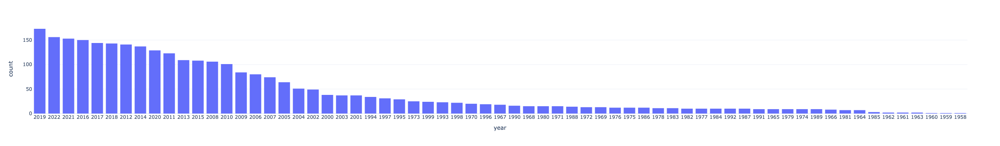

In [8]:
fig = px.histogram(df, x="year", template='plotly_white').update_xaxes(categoryorder='total descending')
fig.show()

In [9]:
# more info can be scrapped from the website!

### High Level Features

In [10]:
df = getDBDataFrame("""
select *
from chords_spotify_df
order by id_chord
""")

MySQL cn is closed


In [11]:
df['year'] = df['release_date'].apply(lambda x : x[0:4])

In [12]:
df.head(1)

,id_chord,id_spotify_track,id_track,danceability,energy,key,loudness,mode,speechiness,acousticness,...,liveness,valence,tempo,duration_ms,time_signature,name,popularity,album_name,release_date,year
0,23,2ap1hCe7wyOWkMJsnIn0V1,1,0.494,0.756,7,-8.504,1,0.0432,0.0014,...,0.164,0.589,133.337,205547.0,4.0,beer drinkers and hell raisers,51,Tres Hombres (Expanded 2006 Remaster),1973-07-26,1973


In [13]:
df.shape

(3484, 21)

In [14]:
df.describe()

,id_chord,id_track,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,popularity
count,3.484000e+03,3484.000000,3484.000000,3484.000000,3484.000000,3484.000000,3484.000000,3484.000000,3484.000000,3484.000000,3484.000000,3484.000000,3484.000000,3.484000e+03,3484.000000,3484.000000
mean,9.522252e+05,5510.612514,0.534427,0.556976,5.223594,-8.285151,0.775545,0.049194,0.347367,0.028712,0.186572,0.442728,120.307119,2.440378e+05,3.914753,58.330941
std,7.580133e+05,3238.328365,0.145102,0.226313,3.523060,3.804752,0.417283,0.045108,0.320300,0.130594,0.166088,0.228483,29.320844,7.075512e+04,0.343799,18.524246
min,2.300000e+01,1.000000,0.065700,0.001880,0.000000,-30.290000,0.000000,0.022400,0.000006,0.000000,0.019700,0.034500,43.260000,4.053300e+04,1.000000,0.000000
25%,3.443975e+05,2697.250000,0.433000,0.385000,2.000000,-10.205250,1.000000,0.030100,0.045875,0.000000,0.097175,0.256000,96.192250,2.041232e+05,4.000000,52.000000
50%,8.721735e+05,5464.500000,0.537000,0.562000,5.000000,-7.520500,1.000000,0.035600,0.248000,0.000004,0.119000,0.407000,119.997000,2.349200e+05,4.000000,62.000000
75%,1.405184e+06,8294.750000,0.637000,0.742000,8.000000,-5.525750,1.000000,0.047600,0.634000,0.000336,0.206000,0.607000,139.921500,2.716100e+05,4.000000,71.000000
max,4.134073e+06,11221.000000,0.946000,0.988000,11.000000,-1.527000,1.000000,0.861000,0.996000,0.985000,0.993000,0.979000,210.813000,1.413307e+06,5.000000,100.000000


## Identifying Categorical Values

In [15]:
df.std()

id_chord            758013.277573
id_track              3238.328365
danceability             0.145102
energy                   0.226313
key                      3.523060
loudness                 3.804752
mode                     0.417283
speechiness              0.045108
acousticness             0.320300
instrumentalness         0.130594
liveness                 0.166088
valence                  0.228483
tempo                   29.320844
duration_ms          70755.121312
time_signature           0.343799
popularity              18.524246
dtype: float64

In [16]:
df.time_signature.value_counts()

4.0    3135
3.0     301
5.0      37
1.0      11
Name: time_signature, dtype: int64

In [17]:
df['mode'].value_counts()

1    2702
0     782
Name: mode, dtype: int64

In [18]:
df['key'].value_counts()

7     454
0     438
9     382
2     365
4     341
1     271
11    250
5     249
6     222
10    210
8     177
3     125
Name: key, dtype: int64

In [19]:
df.sort_values('id_chord')

,id_chord,id_spotify_track,id_track,danceability,energy,key,loudness,mode,speechiness,acousticness,...,liveness,valence,tempo,duration_ms,time_signature,name,popularity,album_name,release_date,year
0,23,2ap1hCe7wyOWkMJsnIn0V1,1,0.494,0.756,7,-8.504,1,0.0432,0.001400,...,0.1640,0.589,133.337,205547.0,4.0,beer drinkers and hell raisers,51,Tres Hombres (Expanded 2006 Remaster),1973-07-26,1973
1,105,0KlWpxzYGq2sjVmwPHprxM,11,0.582,0.744,7,-9.155,1,0.0336,0.000458,...,0.0405,0.674,133.344,272533.0,4.0,ball and chain,26,English Settlement,1982-02-12,1982
2,118,75a66iUfwKdJb5n9juvXRI,14,0.614,0.755,2,-5.829,1,0.0276,0.016200,...,0.0831,0.645,92.622,144787.0,4.0,los angeles,45,Los Angeles,1980-04-26,1980
3,120,3QPQItOROGQUBbStogfu2g,18,0.319,0.807,11,-6.504,0,0.0388,0.001040,...,0.1310,0.601,118.097,226680.0,4.0,the hungry wolf,10,Under The Big Black Sun,1982,1982
4,234,0L2vsEl6rki4Pz0OsoIrNb,20,0.673,0.706,3,-10.107,1,0.0283,0.444000,...,0.1570,0.953,93.157,275067.0,4.0,roses are free,24,Chocolate & Cheese,1994-09-27,1994
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3479,3781055,5HCyWlXZPP0y6Gqq8TgA20,11206,0.591,0.764,1,-5.484,1,0.0483,0.038300,...,0.1030,0.478,169.928,141806.0,4.0,stay,90,STAY (with Justin Bieber),2021-07-09,2021
3480,3860363,5hDeOKeq1jf7SNbnj1RHu8,11211,0.539,0.508,10,-6.050,1,0.0288,0.727000,...,0.1740,0.227,101.358,177720.0,3.0,until i found you,0,She Kissed Me First | Pride Month 2022,2022-06-06,2022
3481,3898172,0WZqHCoOBXqgCCIsUZLC2a,11082,0.644,0.315,6,-9.382,1,0.0339,0.706000,...,0.0962,0.356,60.001,297002.0,4.0,higa,76,Pagsamo,2021-10-01,2021
3482,3911342,0gplL1WMoJ6iYaPgMCL0gX,11215,0.604,0.366,5,-7.519,1,0.0282,0.578000,...,0.1330,0.130,141.981,224695.0,4.0,easy on me,87,Easy On Me,2021-10-14,2021


# Creating some higher categories to analyze data

Inspiration from [here](https://github.com/plamere/OrganizeYourMusic/blob/master/web/index.html)

In [20]:
df['mood'] = df.apply(lambda x: setMoodLabel(x), axis=1)
df = df.astype({"mood":'category'})

In [21]:
df.groupby(['mood']).size() / len(df)

mood
angry       0.044202
bored       0.150689
calm        0.279564
excited     0.114524
happy       0.082090
nervous     0.114811
peaceful    0.003157
pleased     0.080367
relaxed     0.033008
sad         0.062572
sleepy      0.035017
dtype: float64

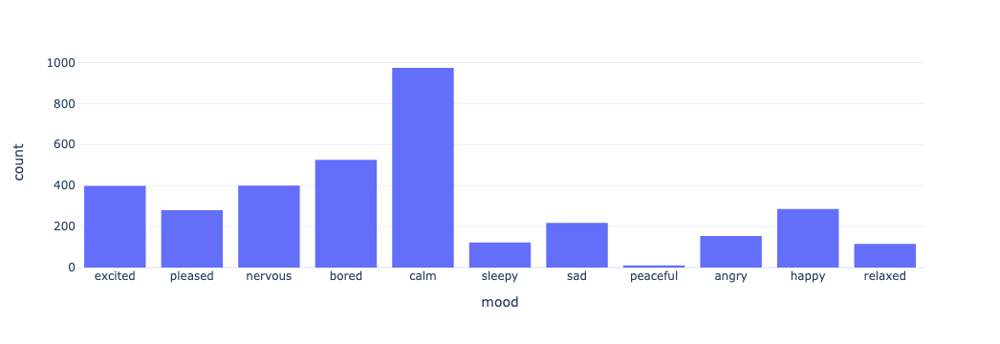

In [22]:
fig = px.histogram(df, x="mood", template='plotly_white')
fig.show()

In [23]:
df['mood'] = df.apply(lambda x: setMoodNumber(x), axis=1)

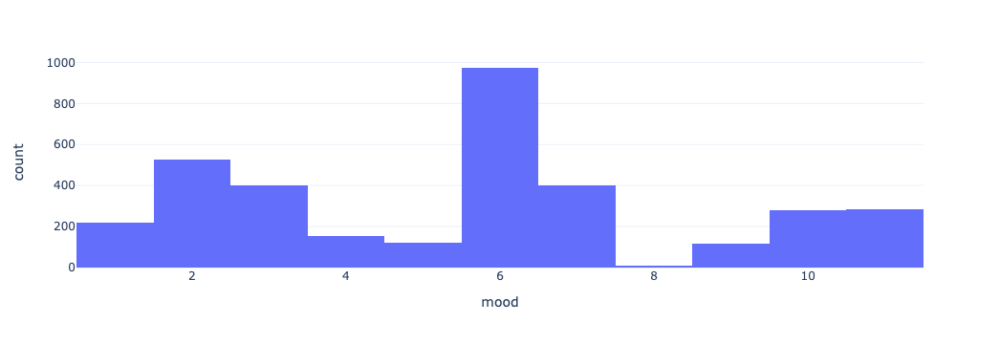

In [24]:
fig = px.histogram(df, x="mood", template='plotly_white')
fig.show()

## Thayer Emotion Classification

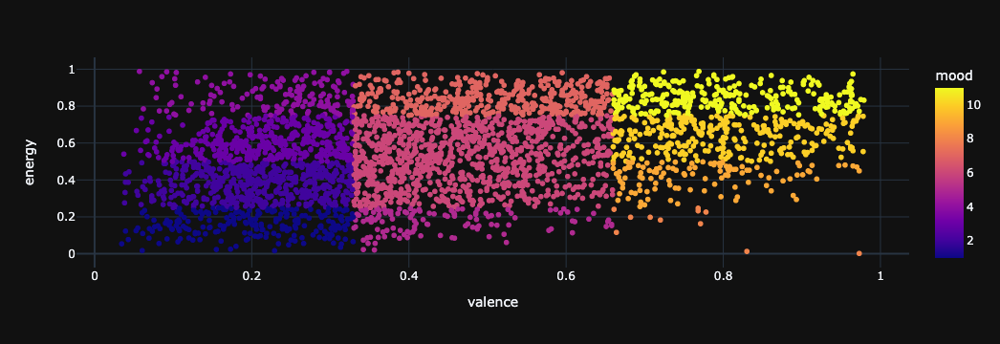

In [25]:
fig = px.scatter(df, x="valence", y="energy", color='mood', template='plotly_dark')
fig.show()

## Changing types to Categories

In [26]:
categorical_features = ['mode', 'key', 'time_signature', 'mood']

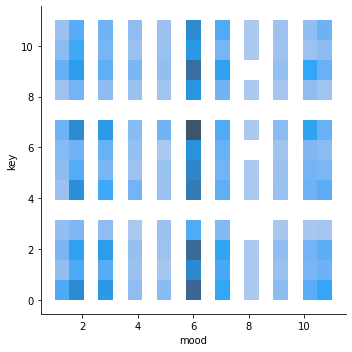

In [27]:
sns.displot(df, x="mood", y="key")

## Undertanding categorical distribution

In [28]:
df[['mode', 'key', 'time_signature', 'mood', 'year']] = df[['mode', 'key', 'time_signature', 'mood', 'year']].astype('category')

In [29]:
df['key'].dtype.name == 'category'

True

In [30]:
((df.groupby(['mode']).size() / len(df)) * 100) 

mode
0    22.445465
1    77.554535
dtype: float64

In [31]:
(df.groupby(['key']).size() / len(df)) * 100

key
0     12.571757
1      7.778416
2     10.476464
3      3.587830
4      9.787600
5      7.146958
6      6.371986
7     13.030999
8      5.080367
9     10.964409
10     6.027555
11     7.175660
dtype: float64

In [32]:
(df.groupby(['time_signature']).size() / len(df)) * 100

time_signature
1.0     0.315729
3.0     8.639495
4.0    89.982778
5.0     1.061998
dtype: float64

In [33]:
(df.groupby(['year']).size() / len(df)) * 100

year
1944    0.028703
1948    0.028703
1951    0.028703
1954    0.057405
1955    0.028703
          ...   
2018    3.444317
2019    3.473020
2020    1.980482
2021    2.468427
2022    3.587830
Length: 71, dtype: float64

# Correlation of features

In [34]:
correlationFeatures = df[['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature', 'popularity', 'year']]

In [35]:
correlationFeatures.year.value_counts()

2012    161
2014    137
2006    133
2017    133
2008    131
       ... 
1954      2
1948      1
1955      1
1951      1
1944      1
Name: year, Length: 71, dtype: int64

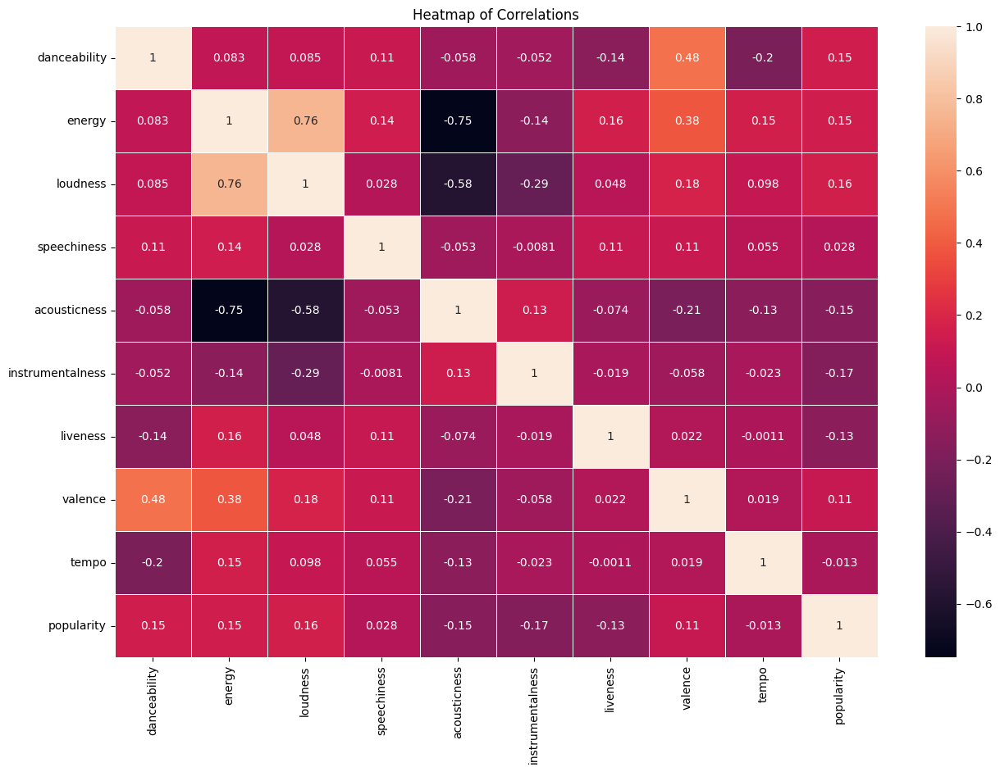

In [36]:
plt.figure(figsize=(15,10))
sns.heatmap(correlationFeatures.corr(),annot=True, linewidth=0.5)
plt.title('Heatmap of Correlations')
plt.show()


Insights from the chart: 
   
- Strong negative correlation between energy and acousticness
- Strong negative correlation between loudness and acousticness
- Strong negative correlation between loudness and energy
- Slightly positive correlation between valence and danceability
- Slightly positve correlation between energy and valence
- Slightly negative correlation between tempo and danceability
- Slightly negative correlation between liveness and danceability
    



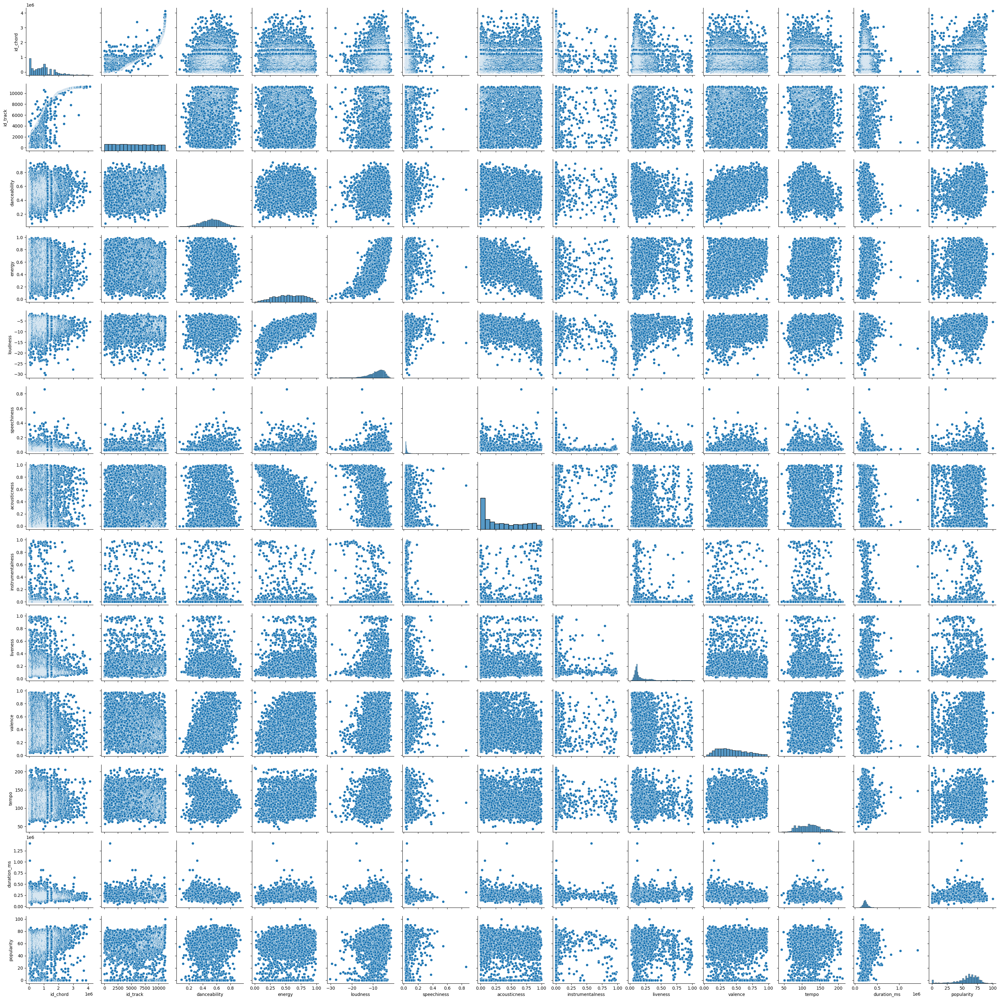

In [37]:
sns.pairplot(df)

In [38]:
df.head()

,id_chord,id_spotify_track,id_track,danceability,energy,key,loudness,mode,speechiness,acousticness,...,valence,tempo,duration_ms,time_signature,name,popularity,album_name,release_date,year,mood
0,23,2ap1hCe7wyOWkMJsnIn0V1,1,0.494,0.756,7,-8.504,1,0.0432,0.001400,...,0.589,133.337,205547.0,4.0,beer drinkers and hell raisers,51,Tres Hombres (Expanded 2006 Remaster),1973-07-26,1973,7
1,105,0KlWpxzYGq2sjVmwPHprxM,11,0.582,0.744,7,-9.155,1,0.0336,0.000458,...,0.674,133.344,272533.0,4.0,ball and chain,26,English Settlement,1982-02-12,1982,10
2,118,75a66iUfwKdJb5n9juvXRI,14,0.614,0.755,2,-5.829,1,0.0276,0.016200,...,0.645,92.622,144787.0,4.0,los angeles,45,Los Angeles,1980-04-26,1980,7
3,120,3QPQItOROGQUBbStogfu2g,18,0.319,0.807,11,-6.504,0,0.0388,0.001040,...,0.601,118.097,226680.0,4.0,the hungry wolf,10,Under The Big Black Sun,1982,1982,7
4,234,0L2vsEl6rki4Pz0OsoIrNb,20,0.673,0.706,3,-10.107,1,0.0283,0.444000,...,0.953,93.157,275067.0,4.0,roses are free,24,Chocolate & Cheese,1994-09-27,1994,10


## :: Exporting Data formated so far into csv ::

In [39]:
os.makedirs('./data', exist_ok=True)  
df.to_csv('./data/03-spotifyFeaturesDirty.csv')

# Univariate and Bivariate analysis

Text(34.875, 0.5, 'Danceability')

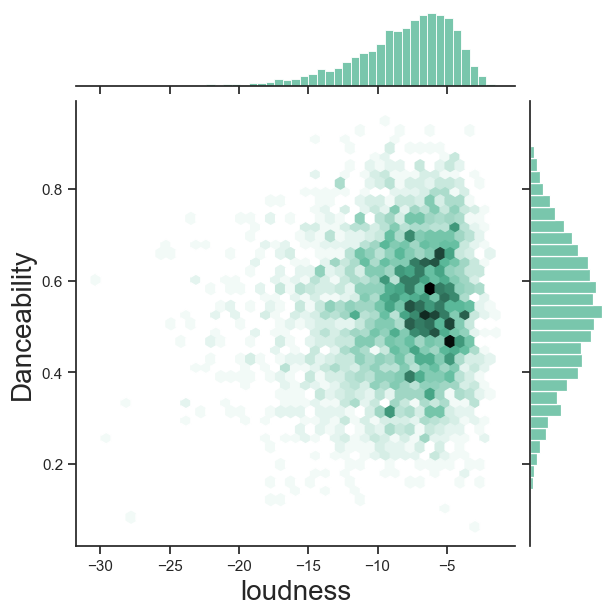

In [40]:
sns.set_theme(style="ticks")

p = sns.jointplot(x=df.loudness.values.tolist(), 
              y=df.danceability.values.tolist(), kind="hex", color="#4CB391")
p.set_axis_labels('x', 'y', fontsize=16)
p.ax_joint.set_xlabel("loudness", fontsize = 20)
p.ax_joint.set_ylabel("Danceability", fontsize = 20)

<font color="blue"> 
There is a negative skewness for loudness whereas Danceability shows rather a normal distribution.
Although there is not a correlation between the two it can be seen that loudness lesser than -10 tend to be songs more danceable. Loudness is more a physical perception and subjective metric.
</font>



**Amount of loudness registers with less than -20 decibels**

In [41]:
len(df[df.loudness < -20 ])

45

Text(34.875, 0.5, 'Danceability')

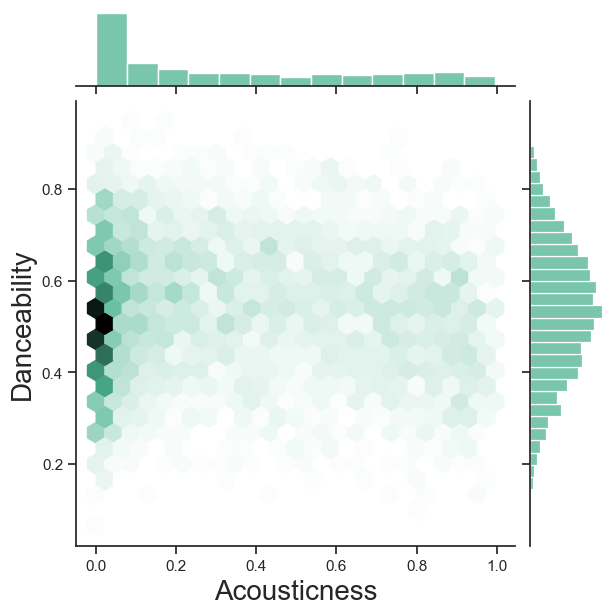

In [42]:
sns.set_theme(style="ticks")

p = sns.jointplot(x=df.acousticness.values.tolist(), 
              y=df.danceability.values.tolist(), kind="hex", color="#4CB391")
p.set_axis_labels('x', 'y', fontsize=16)
p.ax_joint.set_xlabel("Acousticness", fontsize = 20)
p.ax_joint.set_ylabel("Danceability", fontsize = 20)

Text(34.875, 0.5, 'Danceability')

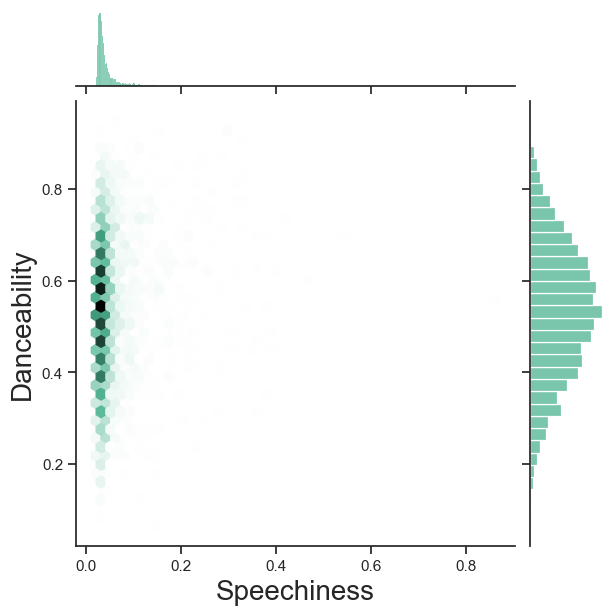

In [43]:
sns.set_theme(style="ticks")

p = sns.jointplot(x=df.speechiness.values.tolist(), 
              y=df.danceability.values.tolist(), kind="hex", color="#4CB391")
p.set_axis_labels('x', 'y', fontsize=16)
p.ax_joint.set_xlabel("Speechiness", fontsize = 20)
p.ax_joint.set_ylabel("Danceability", fontsize = 20)

In [44]:
mediumPresenceSpokenWords = len(df[(df.speechiness > 0.3 ) & (df.speechiness < 0.6 )])

<font color="blue"> 
there's a strong positive skewness on speechiness metric, whereas for the danceability it is normally distributed. Values above 0.66 describe tracks that are probably made entirely of spoken words.
</font>

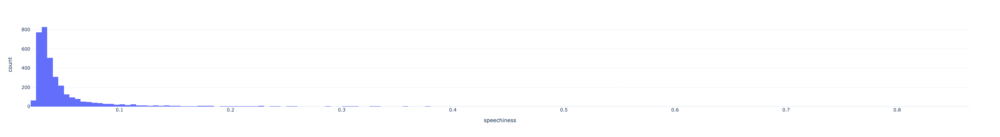

In [45]:
fig = px.histogram(df, x="speechiness", template='plotly_white')
fig.show()

Text(34.875, 0.5, 'Instrumentalness')

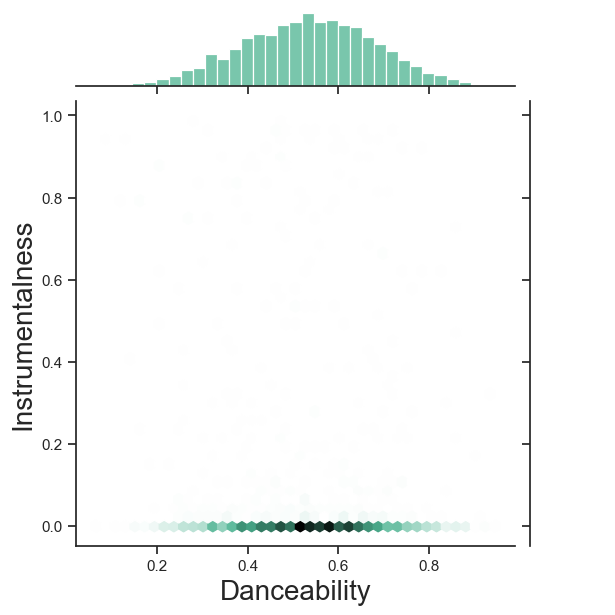

In [46]:
sns.set_theme(style="ticks")

p = sns.jointplot(x=df.danceability.values.tolist(), 
              y=df.instrumentalness.values.tolist(), kind="hex", color="#4CB391")
p.set_axis_labels('x', 'y', fontsize=16)
p.ax_joint.set_xlabel("Danceability", fontsize = 20)
p.ax_joint.set_ylabel("Instrumentalness", fontsize = 20)

<font color="blue"> 
Instrumentalness refers to vocals
</font>

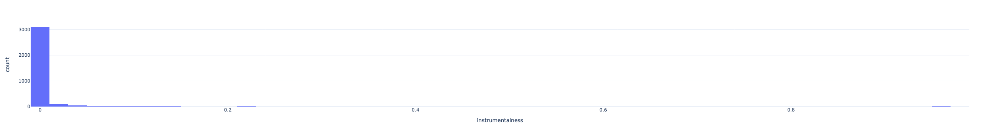

In [47]:
fig = px.histogram(df, x="instrumentalness", template='plotly_white')
fig.show()

Text(34.875, 0.5, 'Danceability')

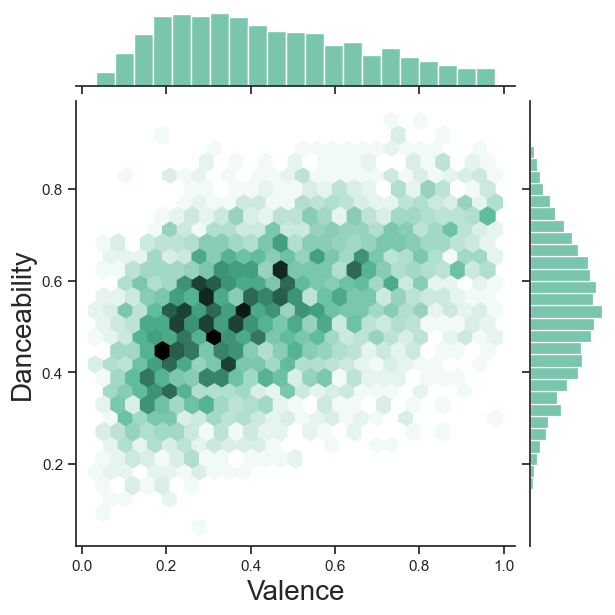

In [48]:
sns.set_theme(style="ticks")

p = sns.jointplot(x=df.valence.values.tolist(), 
              y=df.danceability.values.tolist(), kind="hex", color="#4CB391")
p.set_axis_labels('x', 'y', fontsize=16)
p.ax_joint.set_xlabel("Valence", fontsize = 20)
p.ax_joint.set_ylabel("Danceability", fontsize = 20)

Text(34.875, 0.5, 'Loudness')

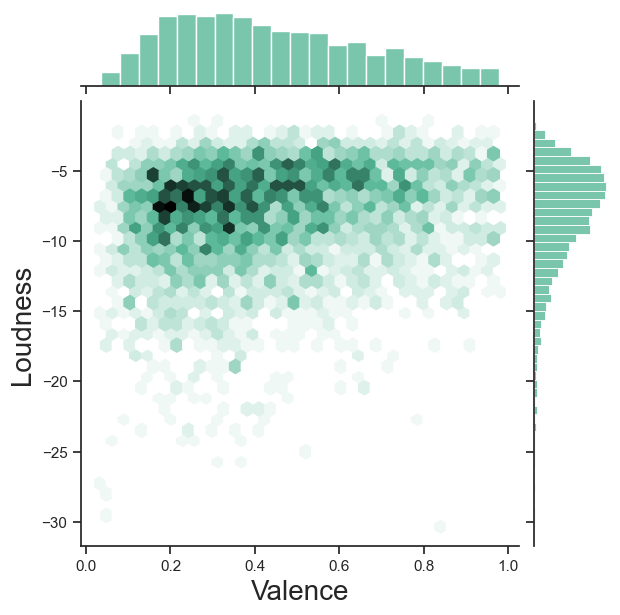

In [49]:
sns.set_theme(style="ticks")

p = sns.jointplot(x=df.valence.values.tolist(), 
              y=df.loudness.values.tolist(), kind="hex", color="#4CB391")
p.set_axis_labels('x', 'y', fontsize=16)
p.ax_joint.set_xlabel("Valence", fontsize = 20)
p.ax_joint.set_ylabel("Loudness", fontsize = 20)

Text(34.875, 0.5, 'Speechiness')

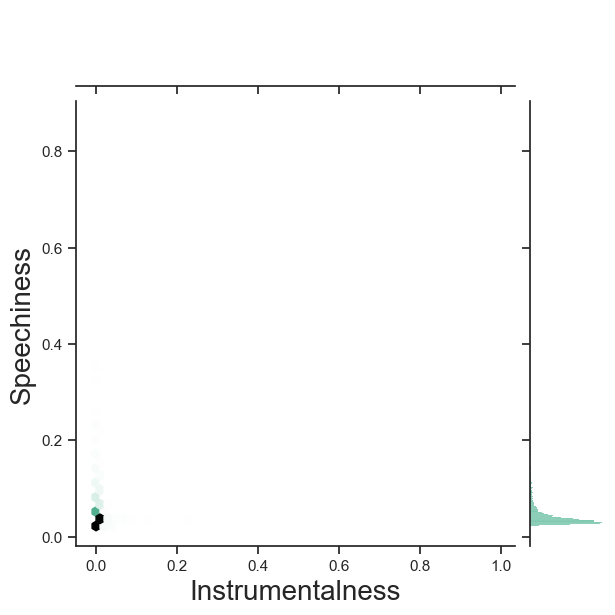

In [50]:
sns.set_theme(style="ticks")

p = sns.jointplot(x=df.instrumentalness.values.tolist(), 
              y=df.speechiness.values.tolist(), kind="hex", color="#4CB391")
p.set_axis_labels('x', 'y', fontsize=16)
p.ax_joint.set_xlabel("Instrumentalness", fontsize = 20)
p.ax_joint.set_ylabel("Speechiness", fontsize = 20)

Text(34.875, 0.5, 'loudness')

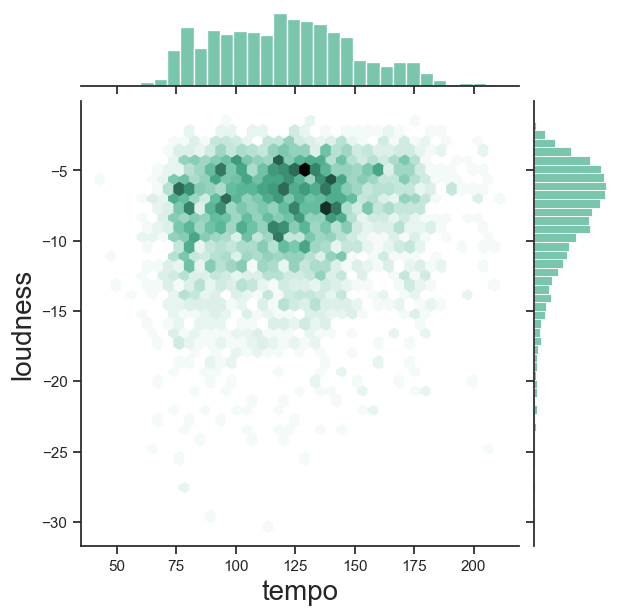

In [51]:
sns.set_theme(style="ticks")

p = sns.jointplot(x=df.tempo.values.tolist(), 
              y=df.loudness.values.tolist(), kind="hex", color="#4CB391")
p.set_axis_labels('x', 'y', fontsize=16)
p.ax_joint.set_xlabel("tempo", fontsize = 20)
p.ax_joint.set_ylabel("loudness", fontsize = 20)

Text(34.875, 0.5, 'energy')

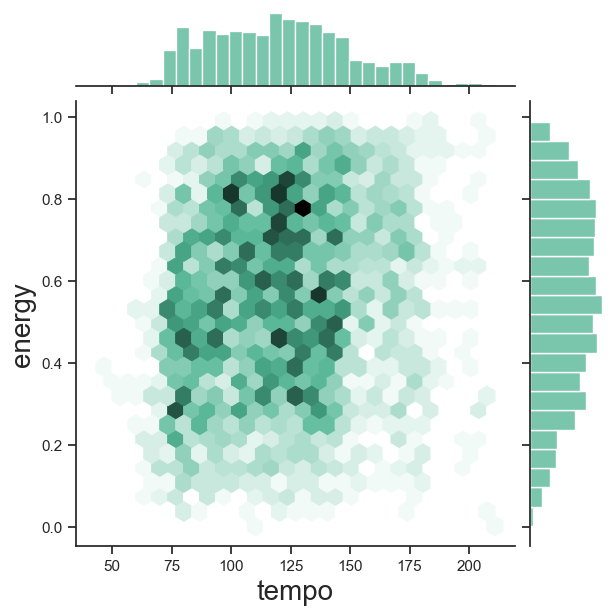

In [52]:
sns.set_theme(style="ticks")

p = sns.jointplot(x=df.tempo.values.tolist(), 
              y=df.energy.values.tolist(), kind="hex", color="#4CB391")
p.set_axis_labels('x', 'y', fontsize=16)
p.ax_joint.set_xlabel("tempo", fontsize = 20)
p.ax_joint.set_ylabel("energy", fontsize = 20)

Text(34.875, 0.5, 'danceability')

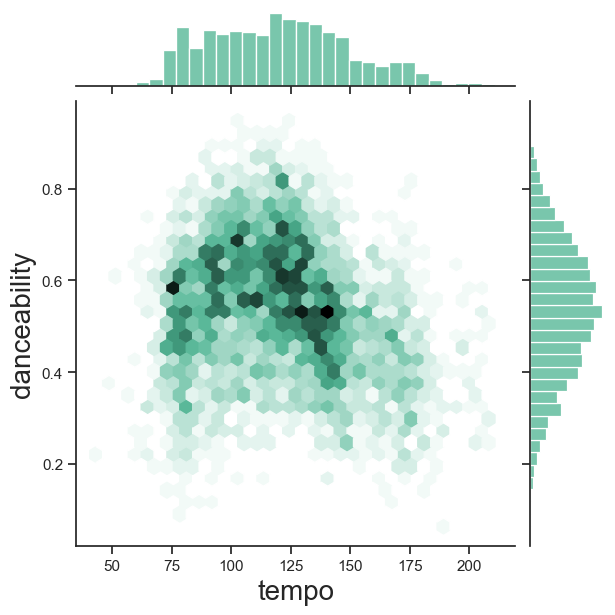

In [53]:
sns.set_theme(style="ticks")

p = sns.jointplot(x=df.tempo.values.tolist(), 
              y=df.danceability.values.tolist(), kind="hex", color="#4CB391")
p.set_axis_labels('x', 'y', fontsize=16)
p.ax_joint.set_xlabel("tempo", fontsize = 20)
p.ax_joint.set_ylabel("danceability", fontsize = 20)

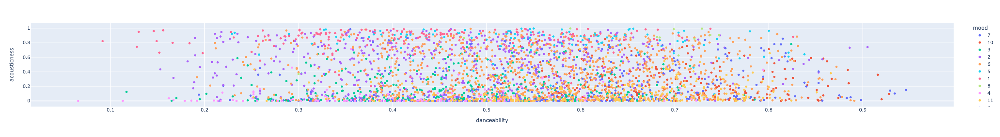

In [54]:
fig = px.scatter(
        df, x="danceability", y="acousticness", 
        color_continuous_scale="Viridis",
        color="mood",hover_data=['name'])
fig.show()


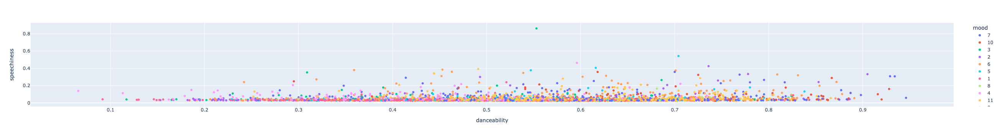

In [55]:
fig = px.scatter(
        df, x="danceability", y="speechiness", 
        color="mood",hover_data=['name'])
fig.show()

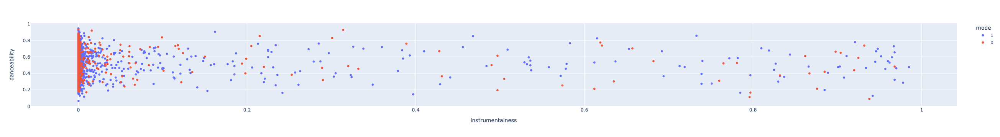

In [56]:
fig = px.scatter(
        df, x="instrumentalness", y="danceability", 
        color="mode",hover_data=['name'])
fig.show()

Apparently Speechiness does not had to do with the danceability of a song.

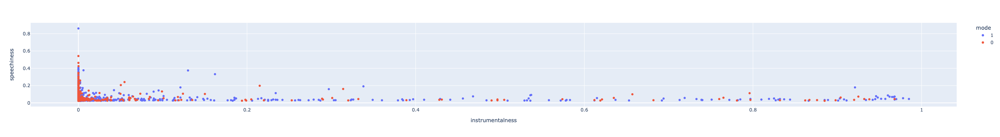

In [57]:
fig = px.scatter(
        df, x="instrumentalness", y="speechiness", 
        color="mode",hover_data=['name'])
fig.show()

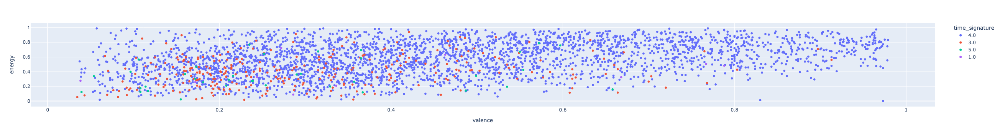

In [58]:
fig = px.scatter(
        df, x="valence", y="energy", 
        color="time_signature",hover_data=['name'])
fig.show()

<AxesSubplot:xlabel='key', ylabel='instrumentalness'>

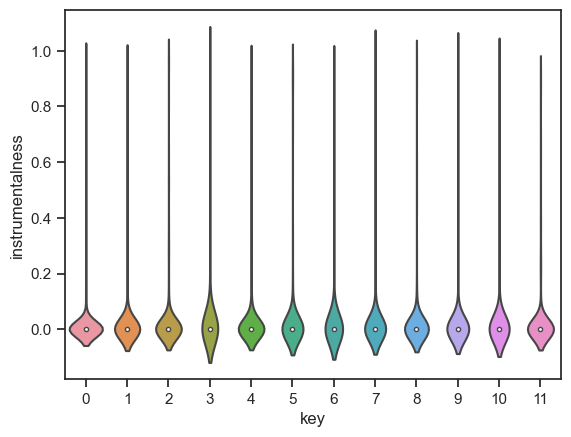

In [59]:
sns.violinplot(x="key", y="instrumentalness", data=df)

Text(34.875, 0.5, 'Danceability')

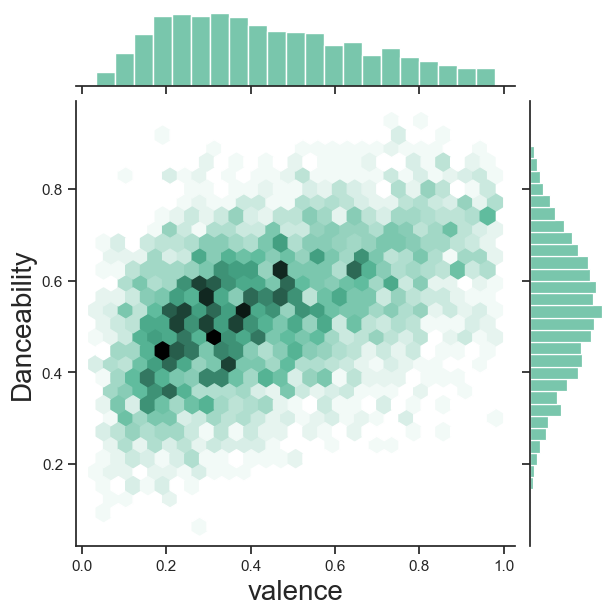

In [60]:
sns.set_theme(style="ticks")

p = sns.jointplot(x=df.valence.values.tolist(), 
              y=df.danceability.values.tolist(), kind="hex", color="#4CB391")
p.set_axis_labels('x', 'y', fontsize=16)
p.ax_joint.set_xlabel("valence", fontsize = 20)
p.ax_joint.set_ylabel("Danceability", fontsize = 20)

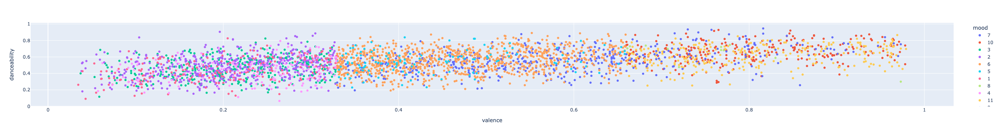

In [61]:
fig = px.scatter(
        df, x="valence", y="danceability", 
        color="mood",hover_data=['name'])
fig.show()

<AxesSubplot:xlabel='mood', ylabel='instrumentalness'>

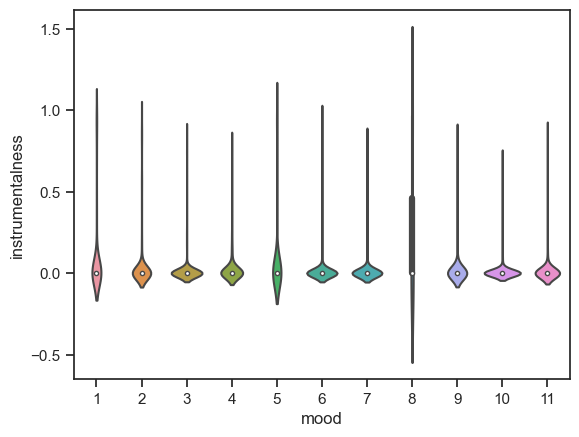

In [62]:
sns.violinplot(x="mood", y="instrumentalness", data=df)

### There is a relation between mood and acousticness

<AxesSubplot:xlabel='mood', ylabel='acousticness'>

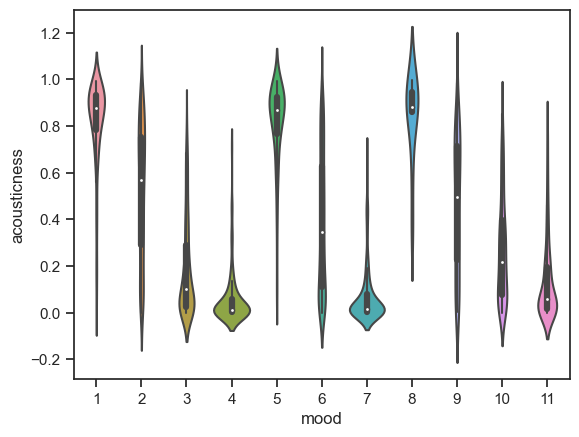

In [63]:
sns.violinplot(x="mood", y="acousticness", data=df)

<AxesSubplot:xlabel='mood', ylabel='liveness'>

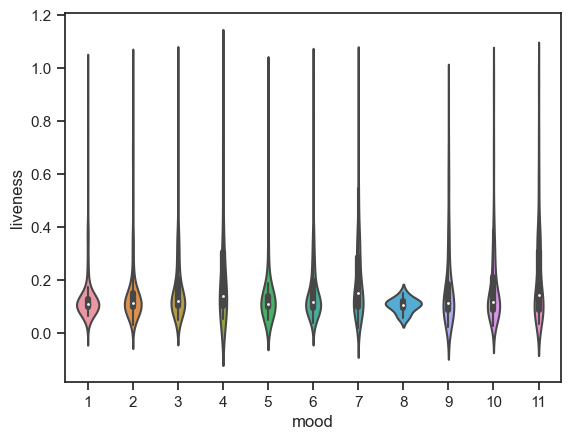

In [64]:
sns.violinplot(x="mood", y="liveness", data=df)

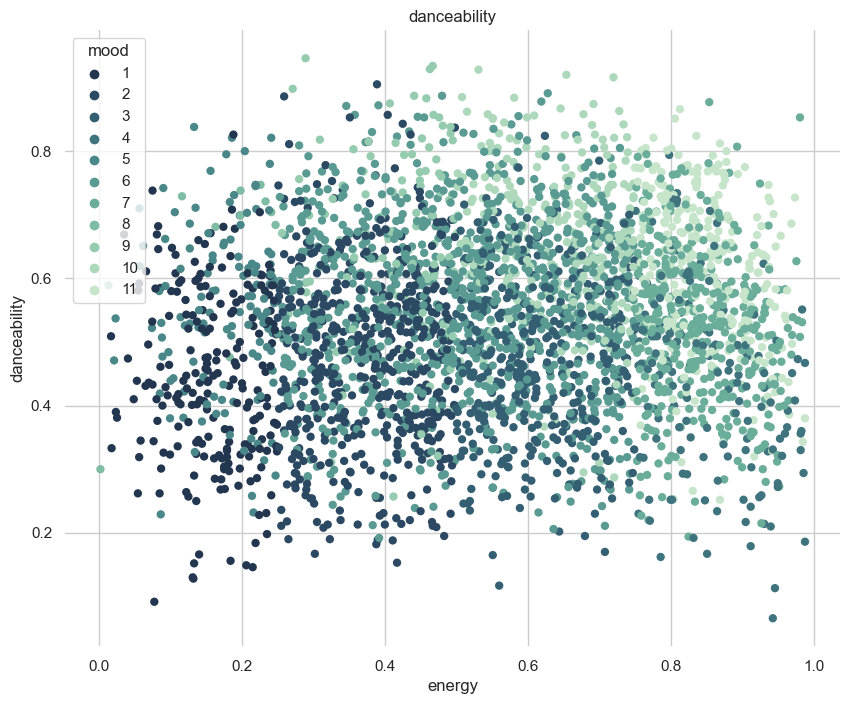

In [65]:
plt.figure(figsize=(10,8))
sns.set_style('whitegrid')
sns.scatterplot(x="energy", y="danceability",
                hue="mood",
                palette="ch:r=-.4,d=.2_r",
                sizes=(50, 300), linewidth=0,
                data=df,legend=True).set(title='danceability')
sns.despine(left = True,bottom=True)

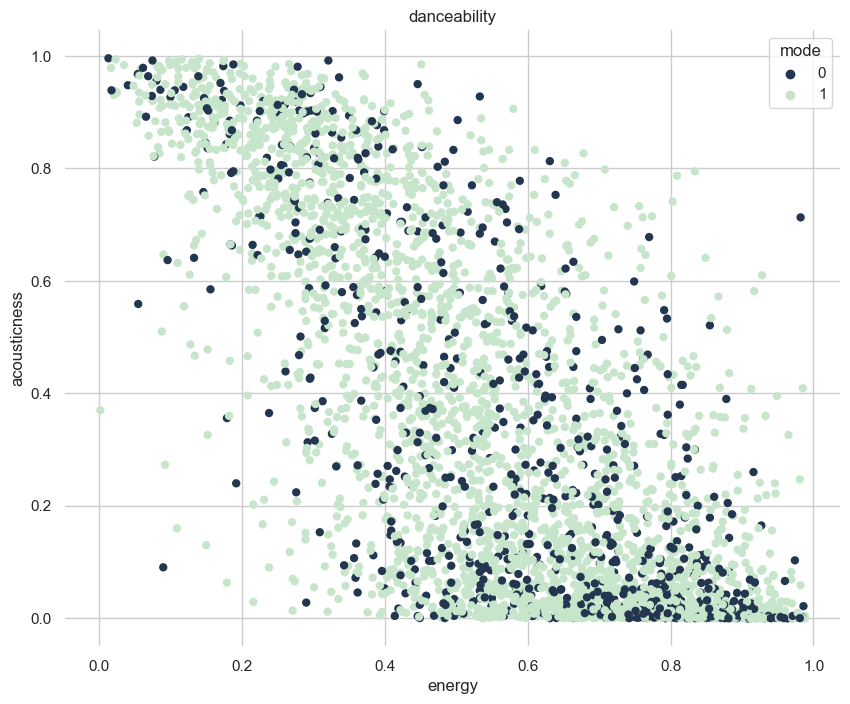

In [66]:
plt.figure(figsize=(10,8))
sns.set_style('whitegrid')
sns.scatterplot(x="energy", y="acousticness",
                hue="mode",
                palette="ch:r=-.4,d=.2_r",
                sizes=(50, 300), linewidth=0,
                data=df,legend=True).set(title='danceability')
sns.despine(left = True,bottom=True)

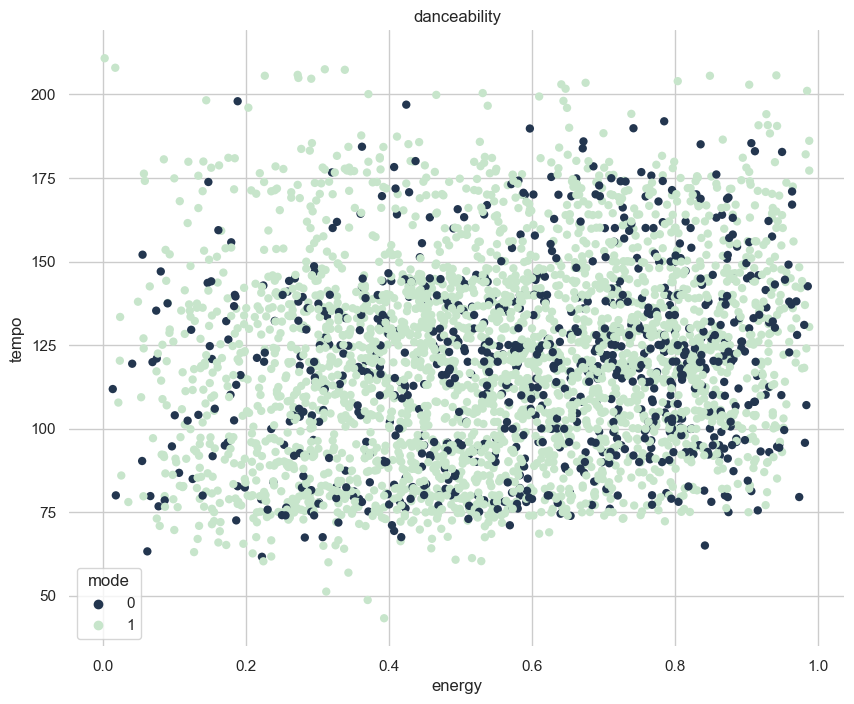

In [67]:
plt.figure(figsize=(10,8))
sns.set_style('whitegrid')
sns.scatterplot(x="energy", y="tempo",
                hue="mode",
                palette="ch:r=-.4,d=.2_r",
                sizes=(50, 300), linewidth=0,
                data=df,legend=True).set(title='danceability')
sns.despine(left = True,bottom=True)

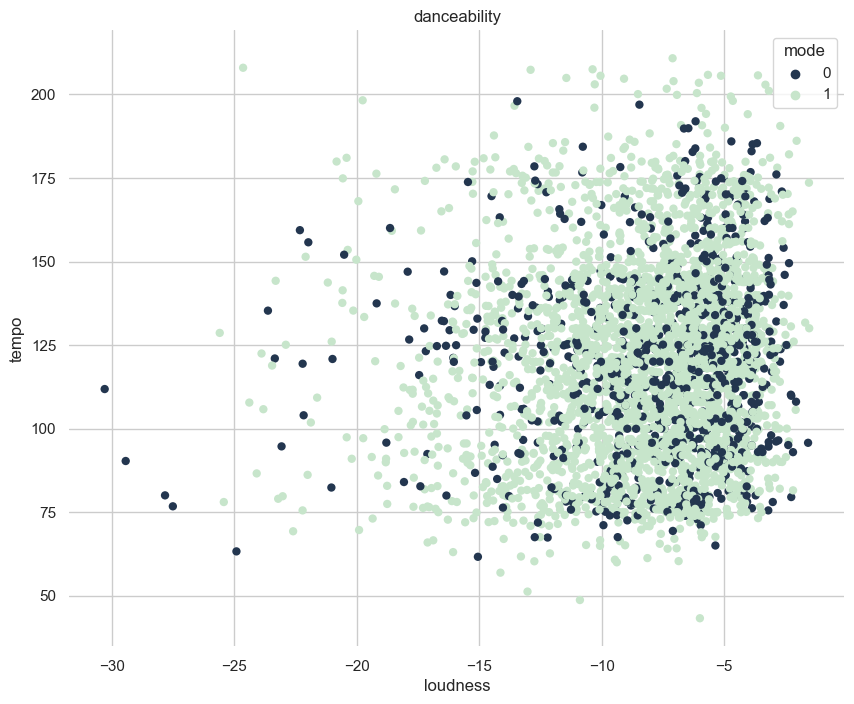

In [68]:
plt.figure(figsize=(10,8))
sns.set_style('whitegrid')
sns.scatterplot(x="loudness", y="tempo",
                hue="mode",
                palette="ch:r=-.4,d=.2_r",
                sizes=(50, 300), linewidth=0,
                data=df,legend=True).set(title='danceability')
sns.despine(left = True,bottom=True)

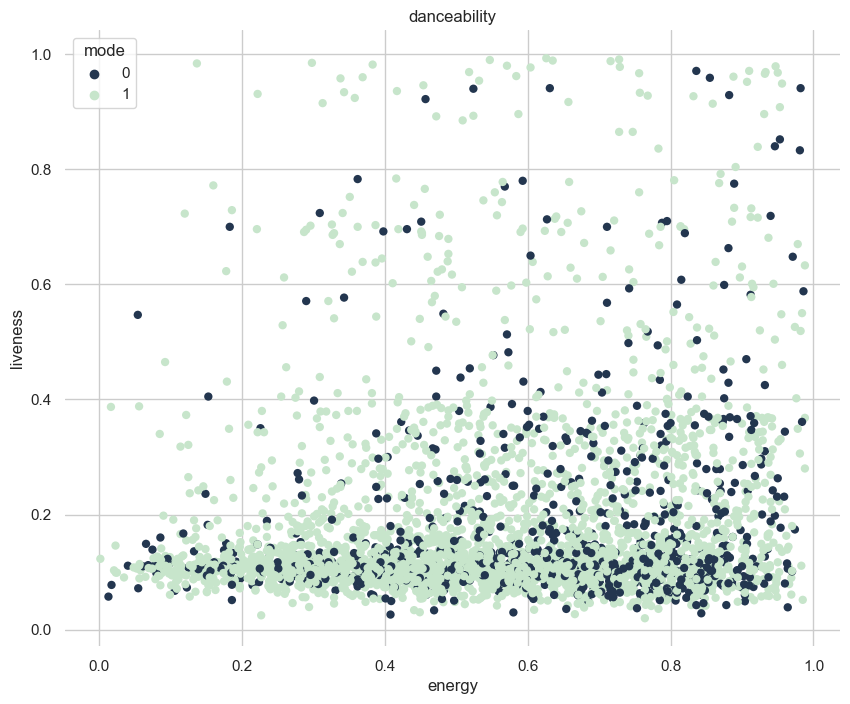

In [69]:
plt.figure(figsize=(10,8))
sns.set_style('whitegrid')
sns.scatterplot(x="energy", y="liveness",
                hue="mode",
                palette="ch:r=-.4,d=.2_r",
                sizes=(50, 300), linewidth=0,
                data=df,legend=True).set(title='danceability')
sns.despine(left = True,bottom=True)

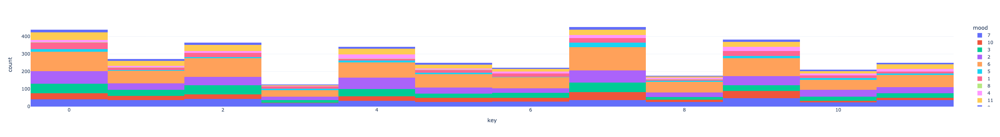

In [70]:
fig = px.histogram(df, x="key", template='plotly_white', color='mood')
fig.show()

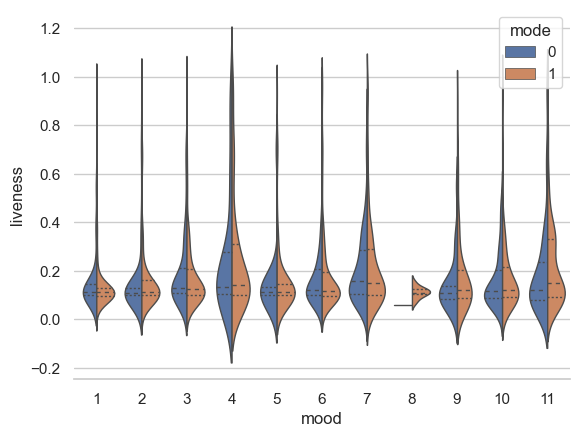

In [71]:

sns.violinplot(data=df, x="mood", y="liveness", hue="mode",
               split=True, inner="quart", linewidth=1)
sns.despine(left=True)

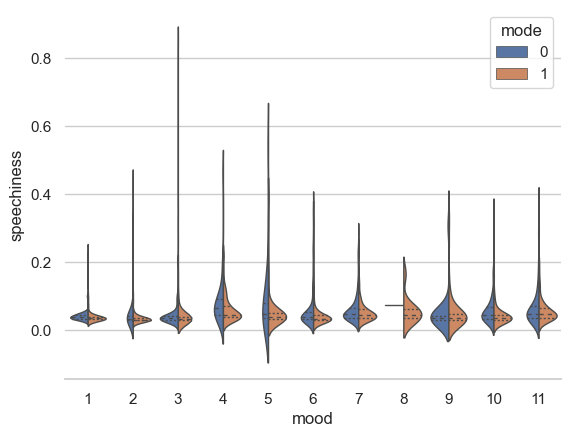

In [72]:

sns.violinplot(data=df, x="mood", y="speechiness", hue="mode",
               split=True, inner="quart", linewidth=1)
sns.despine(left=True)

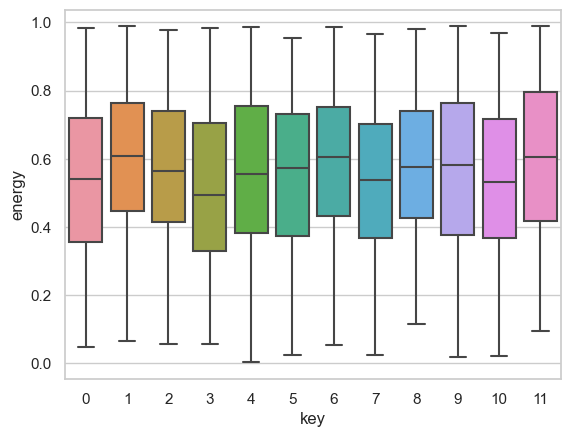

In [73]:
ax = sns.boxplot(x="key", y="energy", data=df)

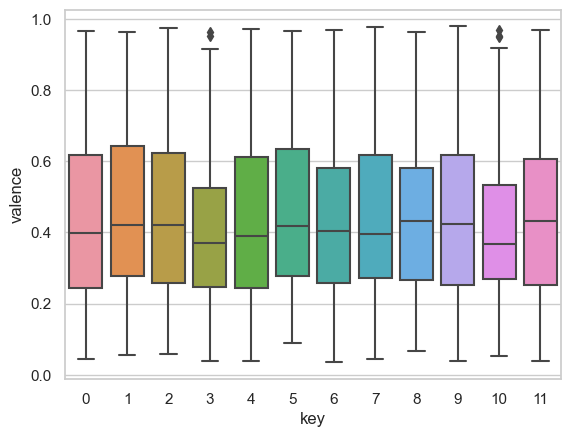

In [74]:
ax = sns.boxplot(x="key", y="valence", data=df)

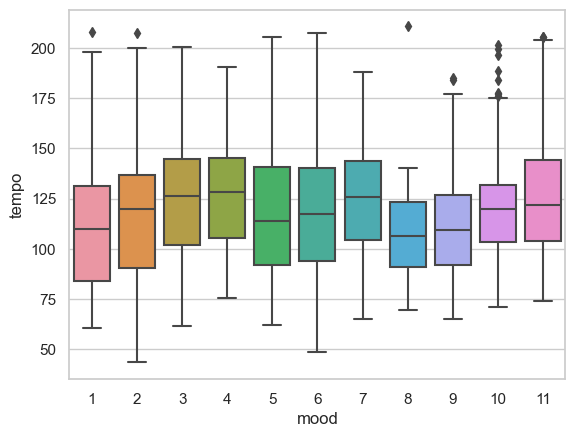

In [75]:
ax = sns.boxplot(x="mood", y="tempo", data=df)

# Popularity of the songs to assess Diversity (missing genre in the data still)

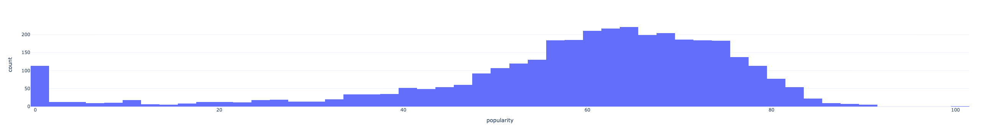

In [76]:
fig = px.histogram(df, x="popularity", template='plotly_white').update_xaxes(categoryorder='total descending')
fig.show()

### Songs with less than 50% of popularity

In [77]:
amount  = df[df['popularity'] <= 50].popularity.count()
total = len(df.index)
percentage = amount / total
percentage

0.22330654420206658

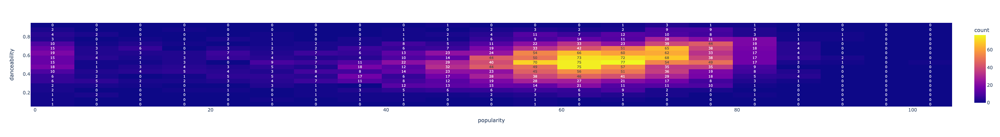

In [78]:
fig = px.density_heatmap(df, x="popularity", y="danceability", text_auto=True)
fig.show()

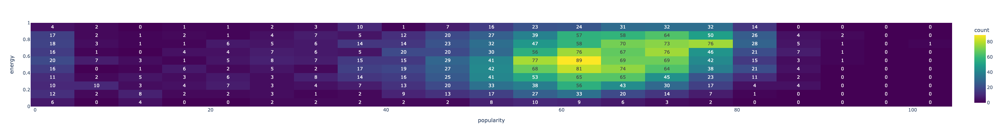

In [79]:
fig = px.density_heatmap(df, x="popularity", y="energy", color_continuous_scale="Viridis", text_auto=True)
fig.show()

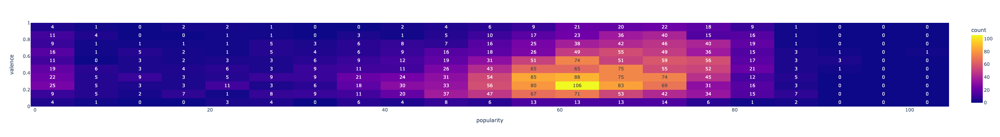

In [80]:
fig = px.density_heatmap(df, x="popularity", y="valence", text_auto=True)
fig.show()

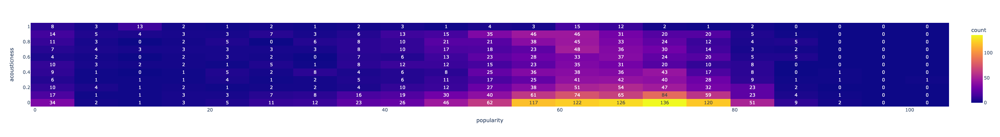

In [81]:
fig = px.density_heatmap(df, x="popularity", y="acousticness", text_auto=True)
fig.show()

## Speechness

Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.

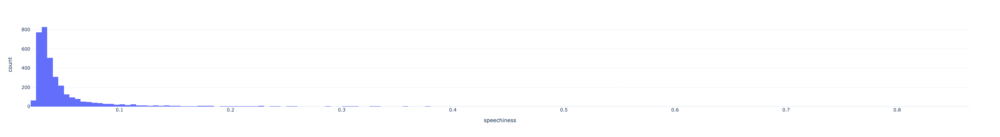

In [82]:

fig = px.histogram(df, x="speechiness", template='plotly_white').update_xaxes(categoryorder='total descending')
fig.show()

In [83]:
df.loc[df.speechiness < 0.33]

,id_chord,id_spotify_track,id_track,danceability,energy,key,loudness,mode,speechiness,acousticness,...,valence,tempo,duration_ms,time_signature,name,popularity,album_name,release_date,year,mood
0,23,2ap1hCe7wyOWkMJsnIn0V1,1,0.494,0.756,7,-8.504,1,0.0432,0.001400,...,0.589,133.337,205547.0,4.0,beer drinkers and hell raisers,51,Tres Hombres (Expanded 2006 Remaster),1973-07-26,1973,7
1,105,0KlWpxzYGq2sjVmwPHprxM,11,0.582,0.744,7,-9.155,1,0.0336,0.000458,...,0.674,133.344,272533.0,4.0,ball and chain,26,English Settlement,1982-02-12,1982,10
2,118,75a66iUfwKdJb5n9juvXRI,14,0.614,0.755,2,-5.829,1,0.0276,0.016200,...,0.645,92.622,144787.0,4.0,los angeles,45,Los Angeles,1980-04-26,1980,7
3,120,3QPQItOROGQUBbStogfu2g,18,0.319,0.807,11,-6.504,0,0.0388,0.001040,...,0.601,118.097,226680.0,4.0,the hungry wolf,10,Under The Big Black Sun,1982,1982,7
4,234,0L2vsEl6rki4Pz0OsoIrNb,20,0.673,0.706,3,-10.107,1,0.0283,0.444000,...,0.953,93.157,275067.0,4.0,roses are free,24,Chocolate & Cheese,1994-09-27,1994,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3479,3781055,5HCyWlXZPP0y6Gqq8TgA20,11206,0.591,0.764,1,-5.484,1,0.0483,0.038300,...,0.478,169.928,141806.0,4.0,stay,90,STAY (with Justin Bieber),2021-07-09,2021,7
3480,3860363,5hDeOKeq1jf7SNbnj1RHu8,11211,0.539,0.508,10,-6.050,1,0.0288,0.727000,...,0.227,101.358,177720.0,3.0,until i found you,0,She Kissed Me First | Pride Month 2022,2022-06-06,2022,3
3481,3898172,0WZqHCoOBXqgCCIsUZLC2a,11082,0.644,0.315,6,-9.382,1,0.0339,0.706000,...,0.356,60.001,297002.0,4.0,higa,76,Pagsamo,2021-10-01,2021,6
3482,3911342,0gplL1WMoJ6iYaPgMCL0gX,11215,0.604,0.366,5,-7.519,1,0.0282,0.578000,...,0.130,141.981,224695.0,4.0,easy on me,87,Easy On Me,2021-10-14,2021,2


In [84]:
len(df)

3484

## Loudness

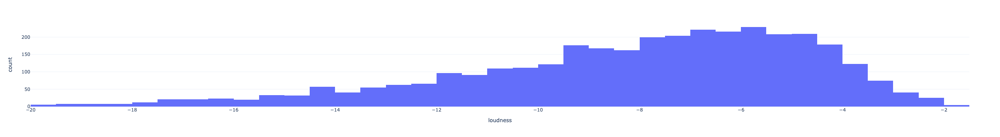

In [85]:

fig = px.histogram(df.loc[df.loudness > -20 ], x="loudness", template='plotly_white').update_xaxes(categoryorder='total descending')
fig.show()

## Instrumentalness

Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.

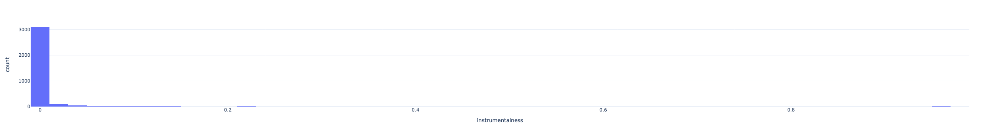

In [86]:

fig = px.histogram(df, x="instrumentalness", template='plotly_white').update_xaxes(categoryorder='total descending')
fig.show()

In [87]:
df.loc[df.instrumentalness > 0.5]

,id_chord,id_spotify_track,id_track,danceability,energy,key,loudness,mode,speechiness,acousticness,...,valence,tempo,duration_ms,time_signature,name,popularity,album_name,release_date,year,mood
23,2147,5sG0gicZTHeXu9n1BBi9PI,95,0.311,0.8150,9,-10.049,0,0.0443,0.2530,...,0.7000,147.173,530204.0,4.0,black magic woman - gypsy queen,26,Sacred Fire: Santana Live In South America,1993-01-01,1993,11
29,3165,7A8caPxvrT8ZgLvQPPUCcj,116,0.527,0.4180,4,-10.205,0,0.0277,0.1420,...,0.2170,129.517,196905.0,4.0,disarm,62,Siamese Dream (2011 - Remaster),1993-07-27,1993,2
32,3991,1uBsu3PbD2909UBIfEMLvK,125,0.595,0.8850,3,-7.688,1,0.0518,0.0744,...,0.6430,137.243,222933.0,4.0,jumpin jack flash,63,Jumpin' Jack Flash / Child Of The Moon,2021-05-28,2021,7
102,15403,60bF2b61f7Q5Bt82QCBwvc,455,0.214,0.4230,8,-9.454,0,0.0323,0.5300,...,0.1360,76.145,419773.0,4.0,brothers in arms,66,Brothers In Arms - 20th Anniversary Edition,1985-05-13,1985,2
167,32120,63OFKbMaZSDZ4wtesuuq6f,803,0.438,0.7100,2,-12.412,1,0.0919,0.2620,...,0.5300,145.928,210373.0,4.0,born to be wild,72,Steppenwolf,1968,1968,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3385,2703894,2IAR0DziHCjSu16gR4ihvy,10889,0.555,0.2700,2,-15.892,1,0.0884,0.9310,...,0.2740,139.691,162797.0,3.0,nothing,79,To Let A Good Thing Die,2020-06-05,2020,2
3387,2728425,3hg1tMeMdz9SUeAwf9dscu,10898,0.546,0.5630,7,-10.209,1,0.0348,0.6660,...,0.3210,116.330,254400.0,4.0,sunshine,52,Mabuk Laut,2018-04-07,2018,3
3404,2848055,77vx7sGjdqwdnQL968t8oY,10960,0.476,0.5780,4,-9.252,1,0.0312,0.1080,...,0.2980,96.978,207216.0,4.0,monolog,65,Walk The Talk,2018-07-15,2018,3
3412,2892650,3ZCTVFBt2Brf31RLEnCkWJ,10987,0.704,0.2250,6,-14.454,0,0.0994,0.9020,...,0.2430,120.006,245426.0,4.0,everything i wanted,81,everything i wanted,2019-11-13,2019,1


## Tempo

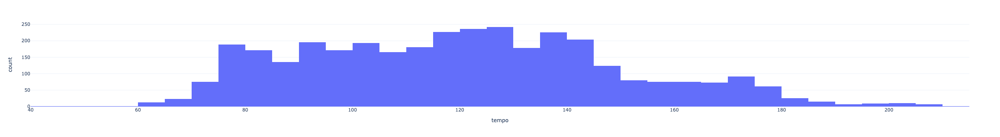

In [88]:
fig = px.histogram(df, x="tempo", template='plotly_white').update_xaxes(categoryorder='total descending')
fig.show()

### YEAR  - MOOD TODO Timeline / energy danceability.. etc

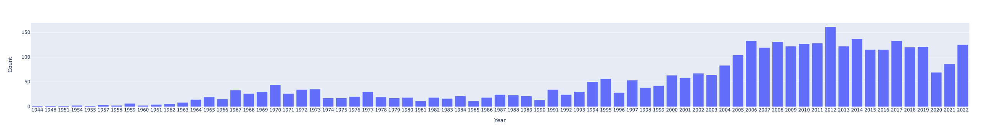

In [89]:
### Songs sorted by year of release"

fig = px.histogram(df, x=df.year.sort_values()).update_layout(
    xaxis_title="Year", yaxis_title="Count"
)
fig.show()

In [90]:
df.key.sort_values()

1907     0
673      0
2888     0
2226     0
347      0
        ..
1700    11
994     11
993     11
2577    11
2694    11
Name: key, Length: 3484, dtype: category
Categories (12, int64): [0, 1, 2, 3, ..., 8, 9, 10, 11]

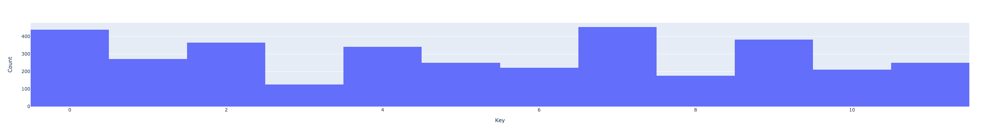

In [91]:
fig = px.histogram(df, x='key').update_layout(
    xaxis_title="Key", yaxis_title="Count"
)
fig.show()

In [92]:
df.key.value_counts().sort_index()


0     438
1     271
2     365
3     125
4     341
5     249
6     222
7     454
8     177
9     382
10    210
11    250
Name: key, dtype: int64

In [93]:
df.loc[df.key == -1]

,id_chord,id_spotify_track,id_track,danceability,energy,key,loudness,mode,speechiness,acousticness,...,valence,tempo,duration_ms,time_signature,name,popularity,album_name,release_date,year,mood


### Instrumentalness

In [97]:
df.instrumentalness

0       0.005200
1       0.001320
2       0.000002
3       0.290000
4       0.003360
          ...   
3479    0.000000
3480    0.000000
3481    0.001620
3482    0.000000
3483    0.001010
Name: instrumentalness, Length: 3484, dtype: float64

In [98]:
df.instrumentalness[df.instrumentalness < 0.1]

0       0.005200
1       0.001320
2       0.000002
4       0.003360
5       0.000000
          ...   
3479    0.000000
3480    0.000000
3481    0.001620
3482    0.000000
3483    0.001010
Name: instrumentalness, Length: 3302, dtype: float64

In [106]:
df.instrumentalness.loc[(df.instrumentalness > 0.1) & (df.instrumentalness < 0.2)]

62      0.121
208     0.181
217     0.194
239     0.118
268     0.112
324     0.177
386     0.105
418     0.121
421     0.118
503     0.133
527     0.122
555     0.141
567     0.187
596     0.199
758     0.157
892     0.113
1128    0.101
1168    0.124
1243    0.113
1375    0.129
1479    0.185
1480    0.161
1481    0.101
1550    0.148
1944    0.119
2085    0.115
2192    0.114
2274    0.183
2294    0.150
2403    0.135
2440    0.153
2529    0.139
2769    0.198
2990    0.149
3160    0.134
3336    0.185
3352    0.162
3367    0.130
3450    0.132
Name: instrumentalness, dtype: float64

In [116]:
df[['id_spotify_track', 'name', 'instrumentalness']].loc[df.instrumentalness > 0.9]

,id_spotify_track,name,instrumentalness
562,7EuoOGbcs8lXiVl7LNVBUU,here i am lord,0.934
669,3OItfXrp5CTffr3AEooaQS,greensleeves,0.904
813,47qs5ARoHhJeFdFkLZ9K7C,jingle bells,0.985
819,0CAaqmvMfkc1d44ckNw1d0,joy to the world,0.968
945,7cvTf4C74dGbrKgXDbQE5e,you are my sunshine,0.920
1277,1dpxKe67LRRplC258yvmBw,the christmas song chestnuts roasting on an op...,0.903
1286,4WWuSl8pSd3zFG4BCOptNR,amazing grace,0.968
1290,4yRlNUdGm46f50040JBSdL,silver bells,0.948
1553,5zi2Zz0wgNPmk6Czq8hZ24,frosty the snowman,0.970
1558,616eLDgYtO6K965UnM1VXF,winter wonderland,0.960


In [ ]:
enc = KBinsDiscretizer(n_bins=10, encode="onehot")
X_binned = enc.fit_transform(X)